#**Modeling and Model Summary** 

The primary target for the project is to train a model which detects a number plate from an image and draws a bounding box over it. This box is used to extarct the number plate information using OCR which can be used for multiple purposes.  

Our model is trained using a huge data set. The Inputs given to model are

1. Car images with number plate
2. XML files defining the location of the number plates using dimensions.

Using these two inputs we trained model to detect the number plate and draw a bounding box over it. 

The output provided by model is when an image is passed to model it gives the predicted coordinates of the rectangular number plate.

This number plate will be cropped from the original image using this dimensions and then we apply OCR on this to eaxtract the number plate text.

We have provided the results of the projects with numbers describing what we have achieved with detail explantion. The results are along with the code so they are in multiple places not in an order.

In [ ]:
import os # The library is used to access the data from the Google Drive
from lxml import etree # The etree is used to access the data from the XML file using the tags

import pandas as pd
import numpy as np
import random as rnd # It is used to genarate Random numbers

import matplotlib.pyplot as plt # it is used to plot the images 
%matplotlib inline

import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split # Used to split the data to train and test data.

The Below cell is used to connect to Google Drive

In [ ]:
import os
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


The below cell is used to load all the images and XMl files to list so that they can be used in the process in a sorted order

In [ ]:
lablfiles = []

imagefiles = []

drlbl = '/content/drive/My Drive/CV/Project_Data/xmlfiles/'

drim =  '/content/drive/My Drive/CV/Project_Data/pngfiles/'

for file in os.listdir(drlbl):
    lablfiles.append(file)

for file in os.listdir(drim):
    imagefiles.append(file)

lablfiles = sorted(lablfiles)

imagefiles= sorted(imagefiles)


In [ ]:
imagefiles

['Cars0.png',
 'Cars1.png',
 'Cars10.png',
 'Cars100.png',
 'Cars101.png',
 'Cars102.png',
 'Cars103.png',
 'Cars104.png',
 'Cars105.png',
 'Cars106.png',
 'Cars107.png',
 'Cars108.png',
 'Cars109.png',
 'Cars11.png',
 'Cars110.png',
 'Cars111.png',
 'Cars112.png',
 'Cars113.png',
 'Cars114.png',
 'Cars115.png',
 'Cars116.png',
 'Cars117.png',
 'Cars118.png',
 'Cars119.png',
 'Cars12.png',
 'Cars120.png',
 'Cars121.png',
 'Cars122.png',
 'Cars123.png',
 'Cars124.png',
 'Cars125.png',
 'Cars126.png',
 'Cars127.png',
 'Cars128.png',
 'Cars129.png',
 'Cars13.png',
 'Cars130.png',
 'Cars131.png',
 'Cars132.png',
 'Cars133.png',
 'Cars134.png',
 'Cars135.png',
 'Cars136.png',
 'Cars137.png',
 'Cars138.png',
 'Cars139.png',
 'Cars14.png',
 'Cars140.png',
 'Cars141.png',
 'Cars142.png',
 'Cars143.png',
 'Cars144.png',
 'Cars145.png',
 'Cars146.png',
 'Cars147.png',
 'Cars148.png',
 'Cars149.png',
 'Cars15.png',
 'Cars150.png',
 'Cars151.png',
 'Cars152.png',
 'Cars153.png',
 'Cars154.png',
 '

The cell below reshapes all the images to a standard size using resize so all of them will be uniform with the XML files allowing us to pick the number plate accurately.

In [ ]:
num_images = []
drim =  '/content/drive/My Drive/CV/Project_Data/pngfiles/'
for file in imagefiles:
    img = cv2.imread(f'{drim}/{file}')
    img = cv2.resize(img, (200,200))
    
    num_images.append(np.array(img))

The cell below is used to get the dimensions of the number palte from XMl file using XTREE library and sizing it accordingly to the image 200 size.

In [ ]:
import pdb
num_labels = []
drl = '/content/drive/My Drive/CV/Project_Data/xmlfiles/'
for file in lablfiles:
    tree = etree.parse(f'{drl}/{file}')
    
    width = int(tree.xpath("size")[0].xpath("width")[0].text)
    
    height = int(tree.xpath("size")[0].xpath("height")[0].text)
    xmin = int(tree.xpath("object/bndbox")[0].xpath("xmin")[0].text)/(width/200)
    ymin = int(tree.xpath("object/bndbox")[0].xpath("ymin")[0].text)/(height/200)
    xmax = int(tree.xpath("object/bndbox")[0].xpath("xmax")[0].text)/(width/200)
    ymax = int(tree.xpath("object/bndbox")[0].xpath("ymax")[0].text)/(height/200)
    num_labels.append([int(xmax), int(ymax), int(xmin), int(ymin)])

In [ ]:
num_labels[100]

[130, 152, 66, 132]

**Results 1 showing the Data used for training the Model**

Here for each image using the XML file data a bounding box is drawn distuiguishing the number plate. 

In [ ]:
plt.figure(figsize = (200,200))
for i in range(50):
    image = cv2.rectangle(num_images[i], (num_labels[i][0], num_labels[i][1]), (num_labels[i][2], num_labels[i][3]), (255, 0, 255))
    plt.subplot(10, 5, i+1)
    plt.axis('off')
    plt.imshow(image)

Below cell we are converting images and Labels to numpyarray for further calculations and scaling it by dividing them by 255 below or equal to 1

In [ ]:
num_images = np.asarray(num_images)
num_labels = np.asarray(num_labels)
num_images = num_images/255
num_labels = num_labels/255

Here we are splitting the Data to train and Test data for the model

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(num_images, num_labels, test_size=0.2, random_state=0)
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.1, random_state=0)

**Experimentation**
1. Set Up
- We have first trained a model using a huge data set of 400 images and XML files. We have then provided an image to the model to predict the Bounding box covering the number plate.
- Then we have cropped the image based on the coordinates provided by model and performed OCR on it to extract the text.
2. Data Sets:
- We have utilized 400 images and XMl files for the Data Set. We have split the Data 80 percenatge of it to train and 20 percentage to test the model.
- We also used 10 percentage of Training Data to validate the model by itself in the process of training which is special input argument for a Kersas model.

3. We have used VGG16 model for the experiments

4. The Libraries and tool we used in the project are mentioned in the first cell and they are described using comments.


In [ ]:
from keras.models import Sequential

from keras.layers import Dense, Flatten

from keras.applications.vgg16 import VGG16

**Literature Review VGG16**

ImageNet, a massive visual database project utilized in visual object recognition software research, uses VGG16, a simple and widely used Convolutional Neural Network (CNN) Architecture. Karen Simonyan and Andrew Zisserman of the University of Oxford created and launched the VGG16 Architecture in their essay "Very Deep Convolutional Networks for Large-Scale Image Recognition" in 2014. 

The term 'VGG' stands for Visual Geometry Group, a group of scholars at the University of Oxford who designed this architecture, and the number '16' indicates that there are 16 layers in this architecture.

In ImageNet, a dataset of over 14 million images belonging to 1000 classes, the VGG16 model obtained 92.7 percent top-5 test accuracy.

Reference : https://neurohive.io/en/popular-networks/vgg16/

As it has very high accuracy rate we have used this model for Analysing our images.


In [ ]:
model = Sequential()
model.add(VGG16(weights="imagenet", include_top=False, input_shape=num_images[0].shape))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 dense (Dense)               (None, 128)               2359424   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                         

**Modeling**

1. Car photos with number plates and XML files describing the placement of the number plates using dimensions are given to the model as inputs.

When an image is submitted to model, it gives the estimated coordinates of the rectangular number plate as an output.

2. Model Description
- The model is a sequential model.
- We have 6 layers in the model out which the VGG16 layer is the most important one which can give upto 138 trainable parameters. I have briefly mentioned about VGG16 in Literature Review. 
- We have 4 dense layers and one flatten layer.Dense layer is utilized in the activation function for a desired output. Flatten layer is utilized for converting the multi dimensional output to single dimension for better flexble usage of output.
- On a whole we have 17,099,140 parameters which is nothing but wieghts which increases the efficiency of the model by using forward process.
- We have calculated the loss and Cost function for each epoch iteration. The loss we calculated is mean_squared_error. The degree of inaccuracy in statistical models is measured by the mean squared error (MSE). The average squared difference between observed and expected values is calculated. The MSE equals zero when a model has no errors. Its value rises as the model inaccuracy rises.

- The Hyper Parameters utilized are 
We utilized 'adam' optimizer as it has highest efficiency over all optimizers.
We used a Batch size of 32.
We have metrics like Accuracy to evaluate the model.




In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [ ]:
model_train = model.fit(X_train, y_train, validation_data = (X_validation, y_validation), epochs=40, batch_size=32, verbose=1)

Epoch 1/40
8/8 [==============================] - 161s 20s/step - loss: 0.0377 - accuracy: 0.3952 - val_loss: 0.0148 - val_accuracy: 0.5000
Epoch 2/40
8/8 [==============================] - 128s 16s/step - loss: 0.0129 - accuracy: 0.6210 - val_loss: 0.0177 - val_accuracy: 0.6071
Epoch 3/40
8/8 [==============================] - 121s 15s/step - loss: 0.0088 - accuracy: 0.7661 - val_loss: 0.0123 - val_accuracy: 0.5357
Epoch 4/40
8/8 [==============================] - 112s 14s/step - loss: 0.0051 - accuracy: 0.7419 - val_loss: 0.0111 - val_accuracy: 0.6786
Epoch 5/40
8/8 [==============================] - 112s 14s/step - loss: 0.0028 - accuracy: 0.8306 - val_loss: 0.0095 - val_accuracy: 0.6786
Epoch 6/40
8/8 [==============================] - 109s 14s/step - loss: 0.0019 - accuracy: 0.9073 - val_loss: 0.0086 - val_accuracy: 0.6786
Epoch 7/40
8/8 [==============================] - 109s 14s/step - loss: 0.0012 - accuracy: 0.8750 - val_loss: 0.0086 - val_accuracy: 0.6786
Epoch 8/40
8/8 [====

**Result 2 Model Performance in terms of Accuracy**

We have achieved a very good Accuracy of   which shows us that the model will be able to detect the number plate from an image provided.

The Accuracy is calculated by comapring X_test and its predicted values which is Y_test

In [ ]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy of the model : %.2f%%" % (scores[1]*100))

Accuracy of the model : 91.43%


Below cell we are predicting the coordinates of number plate using the trained model above.

In [ ]:
y_cord = model.predict(X_test)

**Result 3 Detecting the Number plate by model and representing the plate using a bounding box**

The model have detected 90 percent of images number plate which is great.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

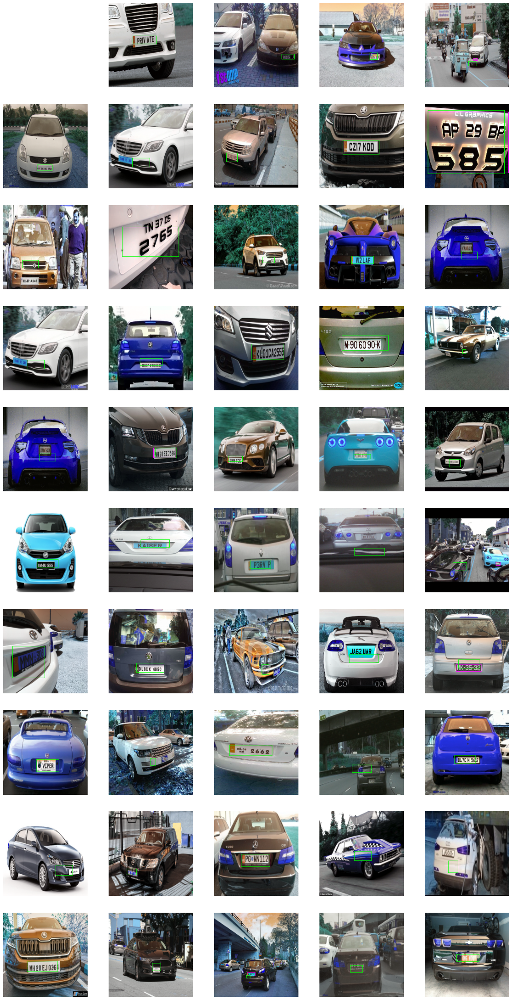

In [ ]:
plt.figure(figsize=(20,40))
for i in range(1,50) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    y_scale = y_cord[i]*255
    image = cv2.rectangle(X_test[i],(int(y_scale[0]),int(y_scale[1])),(int(y_scale[2]),int(y_scale[3])),(0, 255, 0))
    plt.imshow(image)

Here we are starting an Experiment to check the model by predicting one of the image and then we apply OCR to the picture to extarct the text.

In [ ]:
image_test = cv2.imread('/content/drive/My Drive/CV/Project_Data/pngfiles/Cars109.png')
image_test = cv2.resize(image_test, (200,200))
image_test = image_test/255
image_test = np.reshape(image_test, (1,200,200,3))
y_test = model.predict(image_test)
y_test

array([[0.55610704, 0.46865833, 0.21673718, 0.33894542]], dtype=float32)

In the below cell we are upscaling the predcited values so that they willl exactly same scale as Image and then creating a Bounding box over the image with the predicted values from the model.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[141.8073   119.50787   55.267982  86.43108 ]]


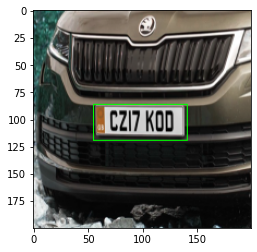

In [ ]:
y_test = y_test*255
print(y_test)

(xmax,ymax,xmin,ymin) = (y_test[0][0],y_test[0][1],y_test[0][2],y_test[0][3])


image = cv2.rectangle(image_test[0],(int(y_test[0][0]),int(y_test[0][1])),(int(y_test[0][2]),int(y_test[0][3])),(0, 255, 0))


plt.imshow(image)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


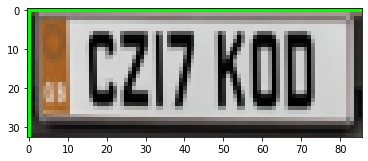

In [ ]:


plt.imshow(image_test[0][int(ymin):int(ymax),int(xmin):int(xmax)])

Below cell we are croppping the image by using the predicted y test values and assigning it to variable.

In [ ]:
numberPlate_Image=image_test[0][int(ymin):int(ymax),int(xmin):int(xmax)]

In [ ]:
numberPlate_Image= numberPlate_Image*255
numberPlate_Image

array([[[0.0000e+00, 6.5025e+04, 0.0000e+00],
        [0.0000e+00, 6.5025e+04, 0.0000e+00],
        [0.0000e+00, 6.5025e+04, 0.0000e+00],
        ...,
        [0.0000e+00, 6.5025e+04, 0.0000e+00],
        [0.0000e+00, 6.5025e+04, 0.0000e+00],
        [0.0000e+00, 6.5025e+04, 0.0000e+00]],

       [[0.0000e+00, 6.5025e+04, 0.0000e+00],
        [7.6000e+01, 6.5000e+01, 5.4000e+01],
        [1.0100e+02, 9.0000e+01, 7.6000e+01],
        ...,
        [1.2600e+02, 1.1400e+02, 1.0100e+02],
        [1.2200e+02, 1.1200e+02, 9.9000e+01],
        [1.2600e+02, 1.1100e+02, 9.6000e+01]],

       [[0.0000e+00, 6.5025e+04, 0.0000e+00],
        [3.9000e+01, 3.4000e+01, 2.8000e+01],
        [1.0000e+02, 9.1000e+01, 8.5000e+01],
        ...,
        [1.1200e+02, 1.0200e+02, 9.6000e+01],
        [6.0000e+01, 5.4000e+01, 4.5000e+01],
        [6.2000e+01, 5.4000e+01, 4.2000e+01]],

       ...,

       [[0.0000e+00, 6.5025e+04, 0.0000e+00],
        [6.1000e+01, 5.7000e+01, 5.3000e+01],
        [5.5000e+01, 5

In the below cell we are conerting the image to unit 8 becuase OCR Reader only accepts 8 or 12 units for extarcting the Characters.

In [ ]:
imgcon = numberPlate_Image.astype(np.uint8)

In [ ]:
imgcon

array([[[  0,   1,   0],
        [  0,   1,   0],
        [  0,   1,   0],
        ...,
        [  0,   1,   0],
        [  0,   1,   0],
        [  0,   1,   0]],

       [[  0,   1,   0],
        [ 76,  65,  54],
        [101,  90,  76],
        ...,
        [126, 114, 101],
        [122, 112,  99],
        [126, 111,  96]],

       [[  0,   1,   0],
        [ 39,  34,  28],
        [100,  91,  85],
        ...,
        [112, 102,  96],
        [ 60,  54,  45],
        [ 62,  54,  42]],

       ...,

       [[  0,   1,   0],
        [ 61,  57,  53],
        [ 55,  51,  49],
        ...,
        [ 32,  31,  28],
        [ 41,  40,  38],
        [ 55,  53,  52]],

       [[  0,   1,   0],
        [ 58,  56,  50],
        [ 53,  52,  47],
        ...,
        [ 39,  36,  34],
        [ 50,  48,  45],
        [ 62,  58,  56]],

       [[  0,   1,   0],
        [ 43,  42,  38],
        [ 42,  42,  37],
        ...,
        [ 59,  54,  53],
        [ 68,  64,  61],
        [ 75,  71,  68]]

In [ ]:
!pip install easyocr


     |████████████████████████████████| 63.6 MB 47 kB/s 
     |████████████████████████████████| 47.8 MB 42 kB/s 


Here we are importing easyOCR and creating a reader object for reading the text.

In [ ]:
import easyocr

reader = easyocr.Reader(['en'])
# detect text
#text = reader.readtext(plateROI)

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


**Final result of an experiment using an image allowing the model to predict the plate and extracting the text using OCR.**

The model is predicting the number plate in most of the cases and OCR is also able to recognise the number plate.

In [ ]:
text = reader.readtext(imgcon)
text[0][1]

'CzI7 Kod'